# Exercise 2 - Model Training and Evaluation

In [1]:
#imports
import joblib
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


In [2]:
import re

#load previously saved artifacts
tfidf = joblib.load("../artifacts/lemmatization/tfidf_vectorizer.joblib")
best_lr_l2 = joblib.load("../artifacts/lemmatization/models/logreg_l2_best.joblib")
best_lr_l1 = joblib.load("../artifacts/lemmatization/models/logreg_l1_best.joblib")
best_mlp   = joblib.load("../artifacts/lemmatization/models/mlp_best.joblib")

#load data (same splits used earlier)
train_csv = "../data/train.csv"
val_csv   = "../data/val.csv"
test_csv  = "../data/test.csv"

val = pd.read_csv(val_csv)
train = pd.read_csv(train_csv)
test = pd.read_csv(test_csv)

import spacy

# load Portuguese model
nlp = spacy.load("pt_core_news_lg")

# lemmatize a text using SpaCy
def lemmatize_text(text):
    doc = nlp(text)
    # join lemmas back into a string
    return " ".join([token.lemma_ for token in doc if not token.is_punct])

# preprocess (same method applied earlier)
# cleaning the dataset - lowercases and removes extra whitespaces in every text
def clean_data(text):
    #check for actual missing values
    if pd.isna(text) or text is None:
        return None
        
    #convert to string and strip whitespace
    text_str = str(text).lower().strip()
    
    #check for literal string "None", "nan", or empty
    if text_str in ['none', 'nan', 'null', '']:
        return None
    
    return text_str

val['text_clean'] = val['Text'].apply(clean_data)
val = val.dropna(subset=['text_clean']).reset_index(drop=True)
val['text_clean'] = val['text_clean'].apply(lemmatize_text)

X_val = tfidf.transform(val['text_clean'])
y_val = val['Label'].values
feature_names = tfidf.get_feature_names_out()

#target class names
class_names = ["Real", "Fake"]

## a) For your best Logistic Regression model, extract and visualize the weights in a bar plot:
### • Top 10 words most indicative of fake news
### • Top 10 words most indicative of real news

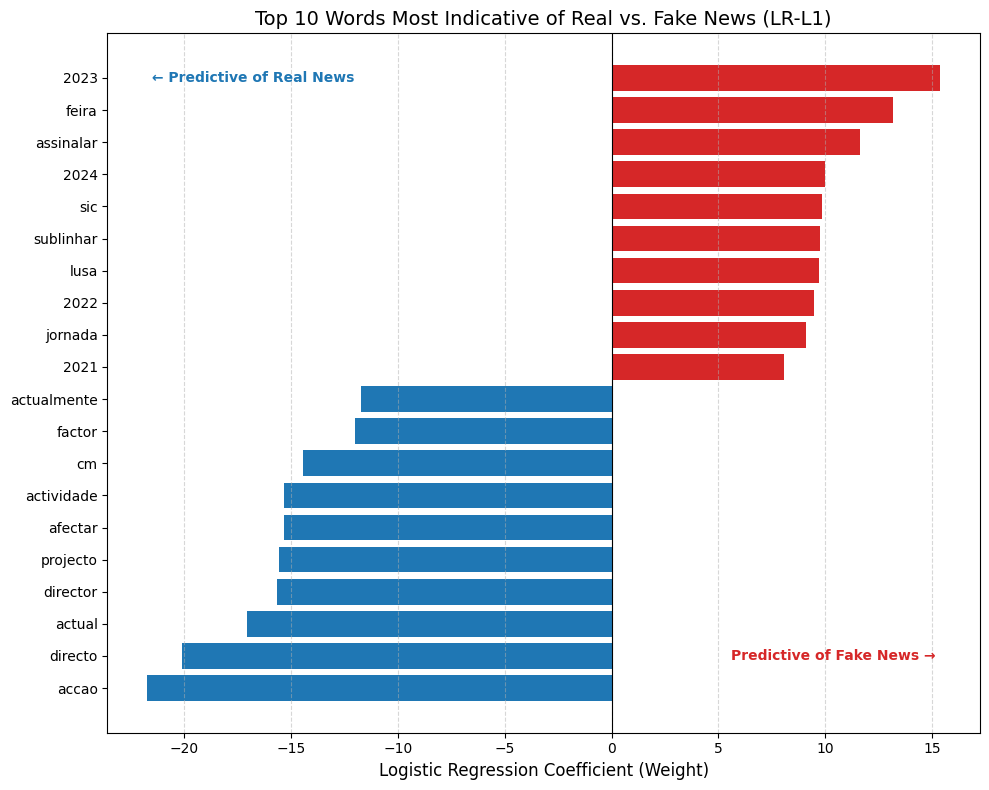

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --- Your existing setup ---
weights = best_lr_l1.coef_[0] 

# 1. Extract Top 10 Fake (Most Positive)
top_fake_idx = np.argsort(weights)[-10:]
fake_words = feature_names[top_fake_idx]
fake_vals = weights[top_fake_idx]

# 2. Extract Top 10 Real (Most Negative)
# Note: We keep the raw negative values for the diverging plot!
top_real_idx = np.argsort(weights)[:10]
real_words = feature_names[top_real_idx]
real_vals = weights[top_real_idx]

# 3. Combine and Sort for Plotting
# We create a dataframe to make sorting easy
df_fake = pd.DataFrame({'word': fake_words, 'weight': fake_vals, 'type': 'Fake'})
df_real = pd.DataFrame({'word': real_words, 'weight': real_vals, 'type': 'Real'})
df = pd.concat([df_real, df_fake])
df = df.sort_values('weight', ascending=True) # Sort so bars flow naturally

# 4. Plotting
plt.figure(figsize=(10, 8))

# Define colors: Blue for Real (negative), Red for Fake (positive)
colors = ['#1f77b4' if x < 0 else '#d62728' for x in df['weight']]

# Create the bars
bars = plt.barh(df['word'], df['weight'], color=colors)

# 5. Aesthetics for Academic Paper
plt.title("Top 10 Words Most Indicative of Real vs. Fake News (LR-L1)", fontsize=14)
plt.xlabel("Logistic Regression Coefficient (Weight)", fontsize=12)
plt.axvline(0, color='black', linewidth=0.8) # Central line
plt.grid(axis='x', linestyle='--', alpha=0.5)

# Add clear text labels for the reader
plt.text(df['weight'].min(), len(df)-1, " ← Predictive of Real News", 
         ha='left', va='center', color='#1f77b4', fontweight='bold')
plt.text(df['weight'].max(), 1, "Predictive of Fake News → ", 
         ha='right', va='center', color='#d62728', fontweight='bold')

plt.tight_layout()
plt.show()

## b) Compare L1 vs L2 regularized models: How many features have non-zero weights in each? What does this tell you about feature selection? When would you prefer L1 vs L2 regularization for text classification?

In [10]:
nz_l2 = np.count_nonzero(best_lr_l2.coef_)
nz_l1 = np.count_nonzero(best_lr_l1.coef_)
total = len(feature_names)

print("Total features:", total)
print("Non-zero (L1):", nz_l1)
print("Non-zero (L2):", nz_l2)
print("L1 removed:", total - nz_l1)
print("L2 removed:", total - nz_l2)

Total features: 5000
Non-zero (L1): 1999
Non-zero (L2): 5000
L1 removed: 3001
L2 removed: 0


## c) For your best Logistic Regression model, select samples in the validation set with ID 2921, 2437, 5557, 1697, and extract explanations with LIME (Ribeiro et al., 2016; Lundberg and Lee, 2017). For a practical reference, check [this](https://marcotcr.github.io/lime/tutorials/Lime%20-%20basic%20usage%2C%20two%20class%20case.html)

In [11]:
#import lime and displayer
from lime.lime_text import LimeTextExplainer
from IPython.display import display, HTML

In [12]:
results = {}

def predict_lr(text_list):
    X = tfidf.transform(text_list)
    return best_lr_l1.predict_proba(X)

explainer = LimeTextExplainer(class_names=class_names)

sample_ids = [2921, 2437, 5557, 1697]

for id in sample_ids:
    text = val.loc[id, 'text_clean'] #get text
    
    results[id] = {}

    exp_lr = explainer.explain_instance(
        text,
        predict_lr,
        num_features=10
    )
    
    results[id]['lr'] = exp_lr.as_list()

    print("\nSample ID:", id)
    display(exp_lr.as_list())
    display(HTML(exp_lr.as_html(text=text)))




Sample ID: 2921


[(np.str_('2023'), 0.043637805468635306),
 (np.str_('2024'), 0.03707069093243717),
 (np.str_('assinalar'), 0.027883205179452284),
 (np.str_('observação'), 0.022918391264043034),
 (np.str_('chegada'), 0.021045213252151522),
 (np.str_('sublinhar'), 0.020951308853489798),
 (np.str_('fenómeno'), -0.012194203995234373),
 (np.str_('el'), -0.008753109412564873),
 (np.str_('temperatura'), -0.008648272556526856),
 (np.str_('climático'), -0.006846218787281384)]


Sample ID: 2437


[(np.str_('director'), -0.08151924524655033),
 (np.str_('alemão'), -0.02309329284401308),
 (np.str_('coronavírus'), -0.01964113995490406),
 (np.str_('terra'), -0.013672438508478178),
 (np.str_('família'), 0.0097639800400242),
 (np.str_('mandar'), -0.008535828354454187),
 (np.str_('ano'), 0.008389603478251175),
 (np.str_('médico'), 0.008258982895179382),
 (np.str_('vacina'), 0.005093051916718295),
 (np.str_('nunca'), -0.004624862269933375)]


Sample ID: 5557


[(np.str_('temporada'), 0.10890529861823993),
 (np.str_('jornada'), 0.09038154399293986),
 (np.str_('liga'), 0.08400296400231426),
 (np.str_('Sporting'), -0.051704458117068565),
 (np.str_('treinador'), 0.042545203505571026),
 (np.str_('completamente'), -0.04206121822270917),
 (np.str_('equipa'), 0.040479667959233884),
 (np.str_('jogar'), 0.039664044567929685),
 (np.str_('salientar'), 0.03892107878563304),
 (np.str_('Benfica'), -0.03734595298273445)]


Sample ID: 1697


[(np.str_('dívida'), -0.14488268278374308),
 (np.str_('ultrapassar'), 0.07896280615237222),
 (np.str_('euro'), -0.0459035809557386),
 (np.str_('primeira'), 0.044970542154777464),
 (np.str_('via'), 0.04046869223779826),
 (np.str_('antecipar'), 0.03590582478063963),
 (np.str_('revelar'), -0.03380709997944374),
 (np.str_('embora'), -0.030418582478928896),
 (np.str_('público'), -0.02806087753289967),
 (np.str_('recentemente'), -0.02736398025882343)]

## d) For your MLP, select samples in the validation set with ID 2921, 2437, 5557, 1697, and extract explanations with LIME and permutation importance. For permutation importance, select 1K random samples. Visualize the results and discuss their differences.

### Lime Analysis

In [13]:
def predict_mlp(text_list):
    X = tfidf.transform(text_list)
    return best_mlp.predict_proba(X)

explainer = LimeTextExplainer(class_names=["Real", "Fake"])

sample_ids = [2921, 2437, 5557, 1697] #ids

for id in sample_ids:
    text = val.loc[id, 'text_clean']

    exp_mlp = explainer.explain_instance(
        text,
        predict_mlp,
        num_features=10
    )

    results[id]['mlp'] = exp_mlp.as_list()
    
    print(f"\nSample ID: {id}")
    display(exp_mlp.as_list())
    display(HTML(exp_mlp.as_html(text=text)))



Sample ID: 2921


[(np.str_('2023'), 0.027490481577109916),
 (np.str_('episódio'), 0.024845877459328872),
 (np.str_('chegada'), 0.024528786018796756),
 (np.str_('assinalar'), 0.022543281458034775),
 (np.str_('observação'), 0.02252815942745203),
 (np.str_('2024'), 0.02248216010941653),
 (np.str_('temperatura'), -0.018146863839359272),
 (np.str_('climático'), -0.002910458797335745),
 (np.str_('el'), -0.0027298171428626334),
 (np.str_('boletim'), -0.00031983966559465414)]


Sample ID: 2437


[(np.str_('director'), -0.005695116495185398),
 (np.str_('empresa'), 0.005342605258802226),
 (np.str_('alemão'), -0.005082260529672118),
 (np.str_('camisola'), -0.004367561466917654),
 (np.str_('coronavírus'), 0.003583830333274118),
 (np.str_('produzir'), -0.003478703350346512),
 (np.str_('contra'), -0.00281704562175698),
 (np.str_('mandar'), -0.002586063367942521),
 (np.str_('famoso'), -0.0023020610862246986),
 (np.str_('50'), 0.0019357177115319148)]


Sample ID: 5557


[(np.str_('época'), 0.05155687085227606),
 (np.str_('jornada'), 0.04652995454416954),
 (np.str_('temporada'), 0.04573857464873064),
 (np.str_('liga'), 0.0429829716367545),
 (np.str_('equipa'), 0.041028193221109475),
 (np.str_('completamente'), -0.015721373261805255),
 (np.str_('alemão'), -0.005209635395516646),
 (np.str_('Sporting'), -0.004456613223467739),
 (np.str_('ler'), -0.00260657596614708),
 (np.str_('Benfica'), -0.0024300057127377627)]


Sample ID: 1697


[(np.str_('dívida'), -0.23408846821903054),
 (np.str_('euro'), -0.19182880472618258),
 (np.str_('ultrapassar'), 0.17649049467105596),
 (np.str_('embora'), -0.16559034237912584),
 (np.str_('emissão'), 0.11746056271116939),
 (np.str_('via'), 0.0961526962532006),
 (np.str_('Portugal'), -0.08573920575911073),
 (np.str_('antecipar'), 0.08364693391636883),
 (np.str_('cofr'), -0.07998425688930719),
 (np.str_('essencialmente'), -0.07433271112222531)]

### Permutation Importance (1000 samples)

Running permutation importance...


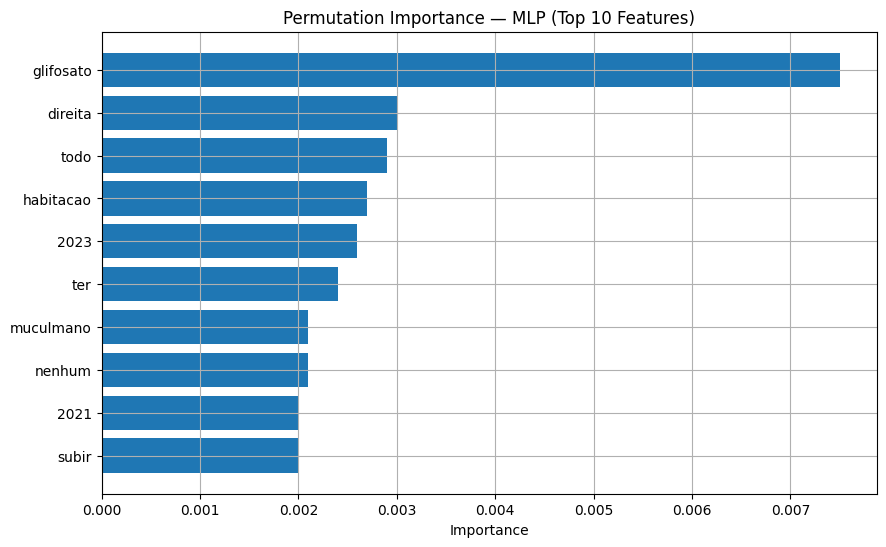

In [8]:
#takes 12 mins to run
from sklearn.inspection import permutation_importance

#sample 1000 random validation items
sample_idx = np.random.choice(X_val.shape[0], 1000, replace=False)
X_val_sample = X_val[sample_idx].toarray()
y_val_sample = y_val[sample_idx]

print("Running permutation importance...")

result = permutation_importance(
    best_mlp, X_val_sample, y_val_sample,
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

# Top 20 most important features
sorted_idx = result.importances_mean.argsort()[::-1][:10]
top_features = feature_names[sorted_idx]
top_scores = result.importances_mean[sorted_idx]

plt.figure(figsize=(10, 6))
plt.barh(top_features, top_scores)
plt.gca().invert_yaxis()
plt.title("Permutation Importance — MLP (Top 10 Features)")
plt.xlabel("Importance")
plt.grid(True)
plt.show()


## Comparison MLP VS LR L1

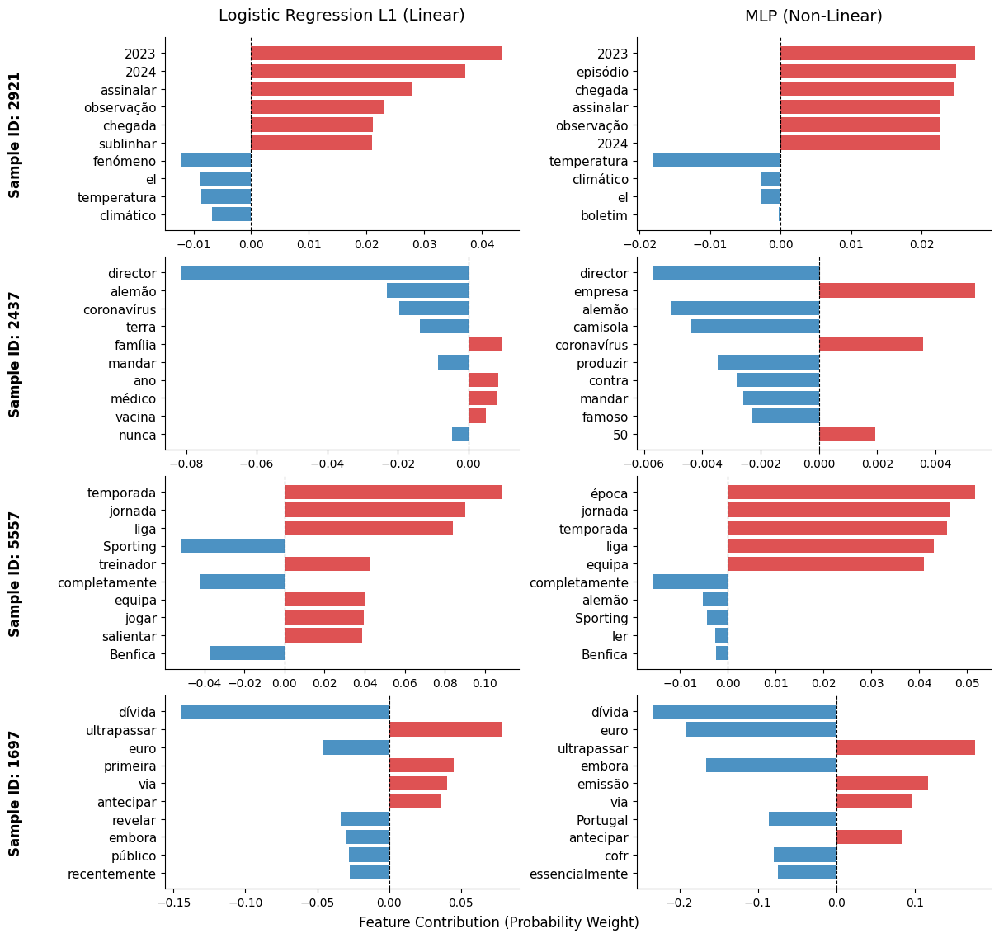

In [14]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 11), constrained_layout=True)

axes[0, 0].set_title("Logistic Regression L1 (Linear)", fontsize=14, pad=15)
axes[0, 1].set_title("MLP (Non-Linear)", fontsize=14, pad=15)

for i, id in enumerate(sample_ids):
    for j, model_key in enumerate(['lr', 'mlp']):
        ax = axes[i, j]
        
        explanation = results[id][model_key]
        features, weights = zip(*explanation)
        
        # invert order
        features = features[::-1]
        weights = weights[::-1]
        
        # colors
        colors = ['#d62728' if w > 0 else '#1f77b4' for w in weights]
        
        y_pos = np.arange(len(features))
        ax.barh(y_pos, weights, color=colors, align='center', alpha=0.8)
        ax.set_yticks(y_pos)
        ax.set_yticklabels(features, fontsize=11)
        
        # vertical line at zero
        ax.axvline(x=0, color='black', linewidth=0.8, linestyle='--')
        
        # alignment
        if j == 0:
            ax.set_ylabel(f"Sample ID: {id}", fontsize=12, fontweight='bold')
            ax.yaxis.set_label_coords(-0.4, 0.5) 
        
        # clean borders
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

fig.supxlabel('Feature Contribution (Probability Weight)', fontsize=12, y=-0.02)

plt.show()